In [86]:
import sys
sys.path.append("../../../")
import utilssphering
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [5]:
evalzoo_combined = pd.read_parquet("../../data/evalzoo_metrics_combined.paraquet")
# Remove site subsamples and look at just replicate scores
evalzoo_combined = evalzoo_combined[
    (~evalzoo_combined["Batch"].str.contains("siteSub")) &
    (evalzoo_combined["metric_type"] == "ref")
    ]
evalzoo_combined

,Batch,Metadata_Plate,Metadata_pert_iname,Metadata_reference_or_other,sim_scaled_mean_i_mean_i,sim_scaled_mean_i_median_i,sim_scaled_median_i_mean_i,sim_scaled_median_i_median_i,sim_ranked_relrank_mean_i_mean_i,sim_ranked_relrank_mean_i_median_i,...,sim_retrieval_r_precision_i_median_i,sim_retrieval_average_precision_i_nlog10pvalue_mean_i,sim_retrieval_average_precision_i_nlog10pvalue_median_i,sim_retrieval_average_precision_i_nlog10qvalue_mean_i,Vendor,Magnification,Binning,z_plane,metric_type,Metadata_moa
0,Scope1_MolDev_10X,Plate2_PCO_6ch_4site_10XPA,A-366,pert,0.017355,0.034813,-0.152331,-0.183784,0.505952,0.531250,...,0.142857,0.333687,0.277463,0.308864,MolDev,10,1,1,ref,None
1,Scope1_MolDev_10X,Plate3_PCO_6ch_4site_10XPA_Crest,A-366,pert,0.017355,0.034813,-0.152331,-0.183784,0.505952,0.531250,...,0.142857,0.333687,0.277463,0.308864,MolDev,10,1,1,ref,None
2,Scope1_MolDev_10X,Plate2_PCO_6ch_4site_10XPA,ABT-737,pert,1.550364,1.901986,1.559669,1.654185,0.158854,0.126488,...,0.571429,2.727806,3.008908,2.293433,MolDev,10,1,1,ref,None
3,Scope1_MolDev_10X,Plate3_PCO_6ch_4site_10XPA_Crest,ABT-737,pert,1.550364,1.901986,1.559669,1.654185,0.158854,0.126488,...,0.571429,2.727806,3.008908,2.293433,MolDev,10,1,1,ref,None
4,Scope1_MolDev_10X,Plate2_PCO_6ch_4site_10XPA,AMG-925,pert,2.544456,2.651249,2.358491,2.587136,0.101935,0.093750,...,0.714286,3.290924,4.000043,2.591954,MolDev,10,1,1,ref,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7311,Scope1_Yokogawa_US_40X_BRO0117059,BRO0117059_40x,selumetinib,pert,0.949837,1.015484,1.127078,1.253564,0.295139,0.250000,...,0.333333,1.123299,0.841086,0.885060,Yokogawa_US,40,1,12,ref,None
7312,Scope1_Yokogawa_US_40X_BRO0117059,BRO0117059_40x,sirolimus,pert,1.461585,1.534622,0.028560,0.072033,0.347222,0.361111,...,0.333333,1.253498,1.222400,0.971353,Yokogawa_US,40,1,12,ref,None
7313,Scope1_Yokogawa_US_40X_BRO0117059,BRO0117059_40x,skepinone-l,pert,1.897167,2.238411,1.718965,1.958182,0.145833,0.090278,...,0.666667,2.279437,2.832817,1.816556,Yokogawa_US,40,1,12,ref,None
7314,Scope1_Yokogawa_US_40X_BRO0117059,BRO0117059_40x,valrubicin,pert,2.094460,2.274195,2.062107,2.293297,0.083333,0.069444,...,0.666667,2.811313,3.301073,2.304229,Yokogawa_US,40,1,12,ref,None


In [27]:
# Report the top pert names wehen you aggregate across all vendors

evalzoo_combined.groupby("Metadata_pert_iname").mean().sort_values("sim_retrieval_average_precision_i_mean_i", ascending=False).reset_index()["Metadata_pert_iname"][0:5].tolist()

['AMG900', 'SCH-900776', 'PF-477736', 'RG7112', 'acriflavine']

In [26]:
# What are the top mAPs for each vendor?

all_top = []
for vend in evalzoo_combined["Vendor"].unique():
    subset_df = evalzoo_combined[evalzoo_combined["Vendor"] == vend]

    top = subset_df.groupby("Metadata_pert_iname").mean().sort_values("sim_retrieval_average_precision_i_mean_i", ascending=False).reset_index()["Metadata_pert_iname"][0:5].tolist()
    all_top += top

    print(f"Top 5 perturbations for {vend} are: {(', ').join(top)}")

pd.DataFrame(all_top).value_counts()

Top 5 perturbations for MolDev are: AMG900, SCH-900776, GSK-3-inhibitor-IX, RG7112, neratinib
Top 5 perturbations for Nikon are: THZ1, AZD2014, Compound2, AMG900, acriflavine
Top 5 perturbations for PE are: PF-477736, AMG900, APY0201, SCH-900776, AZD2014
Top 5 perturbations for Yokogawa_Japan are: PF-477736, acriflavine, Compound2, neratinib, ponatinib
Top 5 perturbations for Yokogawa_US are: PF-477736, THZ1, AMG900, APY0201, SCH-900776


AMG900                4
PF-477736             3
SCH-900776            3
APY0201               2
AZD2014               2
Compound2             2
THZ1                  2
acriflavine           2
neratinib             2
GSK-3-inhibitor-IX    1
RG7112                1
ponatinib             1
dtype: int64

In [90]:
# In what wells were these treatments added?

treatments = ["AMG900", "PF-477736", "SCH-900776", "DMSO"]

platemap = pd.read_csv("../../data/JUMP-MOA_compound_platemap_with_metadata.csv")

for tr in treatments:
    wells = platemap[platemap["pert_iname"] == tr]["well_position"].tolist()    
    print(f"{tr} is in wells: {', '.join(wells)}")

AMG900 is in wells: B19, F16, K07, O08
PF-477736 is in wells: C04, G03, L17, P18
SCH-900776 is in wells: C13, F04, I14, N09
DMSO is in wells: A11, B18, D17, D19, E07, E08, F07, F24, G20, G23, H10, I12, I13, J01, J21, K24, M05, M06, N06, N22, O14, O19, P02, P11


In [76]:
# For each vendor, which plate has the highest mAP for the selected treatments?

treatments = ["AMG900", "PF-477736", "SCH-900776"]
for vend in evalzoo_combined["Vendor"].unique():
    subset_df = evalzoo_combined[evalzoo_combined["Vendor"] == vend]
    for tr in treatments:
        top = subset_df[subset_df["Metadata_pert_iname"] == tr].sort_values("sim_retrieval_average_precision_i_mean_i", ascending=False).reset_index()["Metadata_Plate"][0:2].tolist()
        print(vend, tr, top)

MolDev AMG900 ['Plate3_PCO_6ch_4site_10XPA_Crestz', 'Plate3_PCO_6ch_4site_20XPA_Crestz']
MolDev PF-477736 ['Plate2_PCO_6ch_4site_10XPA', 'Plate3_PCO_6ch_4site_10XPA_Crest']
MolDev SCH-900776 ['Plate3_PCO_6ch_4site_10XPA_Crestz', 'Plate3_PCO_6ch_4site_20XPA_Crestz']
Nikon AMG900 ['BR00117061a', 'BR00117062a']
Nikon PF-477736 ['BR00117061a', 'BR00117062a']
Nikon SCH-900776 ['BR00117061a', 'BR00117062a']
PE AMG900 ['CP_Broad_Phenix_C_BIN1_1Plane_P1', 'CP_Broad_Phenix_C_BIN1_1Plane_P2']
PE PF-477736 ['CP_Broad_Phenix_C_BIN1_1Plane_P1', 'CP_Broad_Phenix_C_BIN1_1Plane_P2']
PE SCH-900776 ['CP_Broad_Phenix_C_BIN1_1Plane_P1', 'CP_Broad_Phenix_C_BIN1_1Plane_P2']
Yokogawa_Japan AMG900 ['20201021T092317', '20201020T134356']
Yokogawa_Japan PF-477736 ['20201021T092317', '20201020T134356']
Yokogawa_Japan SCH-900776 ['20201021T092317', '20201020T134356']
Yokogawa_US AMG900 ['BRO0117014_10x', 'BRO0117033_20xb']
Yokogawa_US PF-477736 ['BRO0117014_10x', 'BRO0117033_20xb']
Yokogawa_US SCH-900776 ['BRO0117


# MolDev
## DMSO
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_A11_s1

## AMG900
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_B19_s1

## PF-477736
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_C04_s1

## SCH-900776
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_C13_s1

# Nikon
## DMSO
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellA11

## AMG900
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellB19

## PF-477736
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellC04

## SCH-900776
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellC13

# PE
## DMSO
### A11 is r01c11
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/'CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1'/Images/r01c11f01

## AMG900
### B19 is r02c19
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/'CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1'/Images/r02c19f01


## PF-477736
### C04 is r03c04
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/'CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1'/Images/r03c04f01


## SCH-900776
### C13 is r03c13
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/'CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1'/Images/r03c13f01


# Yokogawa Japan
The Yokogawa CQ1 filenames contain well information that increments up to 384. This incrementation happens on a per row basis, so 001, 002, 003 is A01, A02, and A03. This was confirmed from the `MeasurementResult.ome.tif` metadata.

## DMSO
### A11 is W0011
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0011F0001

## AMG900
### B19 is 24 + 19 = W0043
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0049F0001


## PF-477736
### C04 is 2*24 + 4 = W0052
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0052F0001


## SCH-900776
### C13 is 2*24 + 13 = W0061
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0061F0001


# Yokogawa US
## DMSO
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_A11_T0001F001

## AMG900
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_B19_T0001F001

## PF-477736
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_C04_T0001F001

## SCH-900776
s3://cellpainting-gallery/cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_C13_T0001F001


In [91]:
# Download MolDev images

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_A11_s1", 
    "../../data/MolDev_DMSO_Plate2-PCO-6ch-4site-10XPA"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_B19_s1", 
    "../../data/MolDev_AMG900_Plate2-PCO-6ch-4site-10XPA"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_C04_s1", 
    "../../data/MolDev_PF-477736_Plate2-PCO-6ch-4site-10XPA"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_C13_s1", 
    "../../data/MolDev_SCH-900776_Plate2-PCO-6ch-4site-10XPA"
    )
    

Downloading: cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_A11_s1_w1.TIF
Downloading: cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_A11_s1_w2.TIF
Downloading: cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_A11_s1_w3.TIF
Downloading: cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_A11_s1_w4.TIF
Downloading: cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PCO-6ch-4site-10XPA_A11_s1_w5.TIF
Downloading: cpg0002-jump-scope/source_4/images/2020_11_06_Scope1_MolDev/images/Plate2-PCO-6ch-4site-10XPA_Plate_20092/TimePoint_1/Plate2-PC

In [92]:
# Download Nikon images

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellA11", 
    "../../data/Nikon_DMSO_BR00117061a"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellB19", 
    "../../data/Nikon_AMG900_BR00117061a"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellC04", 
    "../../data/Nikon_PF-477736_BR00117061a"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellC13", 
    "../../data/Nikon_SCH-900776_BR00117061a"
    )
    

Downloading: cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellA11_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0010.nd2
Downloading: cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellB19_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0029.nd2
Downloading: cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellC04_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0051.nd2
Downloading: cpg0002-jump-scope/source_4/images/2020_11_24_Scope1_Nikon/201026_kag_Painting_Test_BR00117061a__20201110_105314_621/WellC13_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0060.nd2


In [94]:
# Download PE images

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1/Images/r01c11f01", 
    "../../data/PE_DMSO_CP_Broad_Phenix_C_BIN1_1Plane_P1"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1/Images/r02c19f01", 
    "../../data/PE_AMG900_CP_Broad_Phenix_C_BIN1_1Plane_P1"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1/Images/r03c04f01", 
    "../../data/PE_PF-477736_CP_Broad_Phenix_C_BIN1_1Plane_P1"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1/Images/r03c13f01", 
    "../../data/PE_SCH-900776_CP_Broad_Phenix_C_BIN1_1Plane_P1"
    )
    

Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1/Images/r01c11f01p01-ch1sk1fk1fl1.tiff
Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1/Images/r01c11f01p01-ch2sk1fk1fl1.tiff
Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1/Images/r01c11f01p01-ch3sk1fk1fl1.tiff
Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1/Images/r01c11f01p01-ch4sk1fk1fl1.tiff
Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_PE/images/C_BIN1_1Plane/CP Broad Phenix C BIN1 1Plane P1__2020-11-11T09_26_12-Measurement 1/Images/r01c11f01p01-ch5sk1fk1fl1.tiff
Downloading: cpg0002

In [97]:
# Download Yokogawa Japan images

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0011F0001", 
    "../../data/Yokogawa_Japan_DMSO_20201021T092317"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0049F0001", 
    "../../data/Yokogawa_Japan_AMG900_20201021T092317"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0052F0001", 
    "../../data/Yokogawa_Japan_PF-477736_20201021T092317"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0061F0001", 
    "../../data/Yokogawa_Japan_SCH-900776_20201021T092317"
    )
    

Downloading: cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0011F0001T0001Z000C1.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0011F0001T0001Z000C2.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0011F0001T0001Z000C3.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0011F0001T0001Z000C4.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0011F0001T0001Z000C5.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0011F0001T0001ZSUMC1.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_10_27_Scope1_YokogawaJapan/images/20201021T092317_/Projection/W0011F0001T0001ZSUMC2.tif
Downloading: 

In [98]:
# Download Yokogawa US images

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_A11_T0001F001", 
    "../../data/Yokogawa_US_DMSO_BRO0117014"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_B19_T0001F001", 
    "../../data/Yokogawa_US_AMG900_BRO0117014"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_C04_T0001F001", 
    "../../data/Yokogawa_US_PF-477736_BRO0117014"
    )

utilssphering.download_from_cpg(
    "cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_C13_T0001F001", 
    "../../data/Yokogawa_US_SCH-900776_BRO0117014"
    )
    

Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_A11_T0001F001L01A01Z01C02.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_A11_T0001F001L01A01Z01C03.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_A11_T0001F001L01A02Z01C04.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_A11_T0001F001L01A02Z01C05.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-singleplane-10x_20201026_113115/PECCU/PECCU_A11_T0001F001L01A03Z01C01.tif
Downloading: cpg0002-jump-scope/source_4/images/2020_11_16_Scope1_YokogawaUS/images/BRO0117014-3D-2x2x1-single

# MolDev images

In [131]:
df = pd.read_csv("/Users/ctromans/Desktop/input/profiles/Scope1_Yokogawa_US_10X/BRO0117014_10x/BRO0117014_10x_normalized_feature_select_negcon_plate.csv.gz")

# Move metadata containing columns to the start
metadata_columns = [col for col in df.columns if "Metadata" in col]
df = df[metadata_columns + [col for col in df.columns if col not in metadata_columns]]


df.to_csv("hello.csv")

df

,Metadata_broad_sample,Metadata_solvent,Metadata_Plate,Metadata_Well,Metadata_InChIKey,Metadata_pert_iname,Metadata_pubchem_cid,Metadata_moa,Metadata_pert_type,Metadata_control_type,...,Nuclei_Texture_InfoMeas1_BrightField_20_01_256,Nuclei_Texture_InfoMeas1_DNA_20_00_256,Nuclei_Texture_SumAverage_DNA_20_02_256,Nuclei_Texture_SumVariance_BrightField_20_03_256,Nuclei_Texture_SumVariance_DNA_20_03_256,Nuclei_Texture_SumVariance_Mito_20_00_256,Nuclei_Texture_SumVariance_Mito_20_01_256,Nuclei_Texture_SumVariance_Mito_20_03_256,Nuclei_Texture_SumVariance_RNA_20_02_256,Nuclei_Texture_Variance_DNA_20_03_256
0,BRD-K80935598-001-01-1,DMSO,BRO0117014_10x,A01,ZYVXTMKTGDARKR-UHFFFAOYSA-N,AZ191,72716000.0,DYRK inhibitor,trt,NaN,...,2.65340,6.8371,-5.96410,-0.78003,-3.440700,-2.55510,-3.28700,-4.2148,4.30650,-3.73260
1,BRD-K85776940-001-01-9,DMSO,BRO0117014_10x,A02,ODADKLYLWWCHNB-LDYBVBFYSA-N,delta-Tocotrienol,5282400.0,HMGCR inhibitor,trt,NaN,...,1.98240,6.7195,-6.18560,0.18942,-3.216000,-1.75180,-2.28230,-2.0519,3.57650,-3.52060
2,BRD-K25611237-001-02-1,DMSO,BRO0117014_10x,A03,QDBVSOZTVKXUES-UHFFFAOYSA-N,ML324,44143000.0,histone lysine demethylase inhibitor,trt,NaN,...,4.30570,6.7147,-5.85530,-0.85272,-2.731100,7.77320,-1.03870,19.5590,3.04190,-3.00720
3,BRD-K66430217-001-03-8,DMSO,BRO0117014_10x,A04,CXJCGSPAPOTTSF-VURMDHGXSA-N,KH-CB19,44237000.0,CDC inhibitor,trt,NaN,...,1.03620,5.3537,-4.60430,2.28660,-2.919500,0.32211,0.67886,2.3368,4.88970,-3.21280
4,BRD-K38627885-001-01-9,DMSO,BRO0117014_10x,A05,RFZQYGBLRIKROZ-PCLIKHOPSA-N,APY0201,56928000.0,phosphoinositide dependent kinase inhibitor,trt,NaN,...,12.15700,10.1140,-9.56030,-2.76230,-3.452900,-2.97470,-4.57550,-4.1545,2.77100,-3.66590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379,BRD-K16803204-001-01-6,DMSO,BRO0117014_10x,P20,RIJLVEAXPNLDTC-UHFFFAOYSA-N,filgotinib,49831000.0,JAK inhibitor,trt,NaN,...,1.78830,1.8193,-1.66220,1.21370,0.817720,2.86160,2.38700,4.1860,2.06740,0.62161
380,BRD-K02965346-001-07-5,DMSO,BRO0117014_10x,P21,FPYJSJDOHRDAMT-KQWNVCNZSA-N,SU-11274,9549300.0,hepatocyte growth factor receptor inhibitor,trt,NaN,...,-0.00784,1.2931,-0.43432,2.67940,0.674750,6.27050,17.34900,4.4259,-0.14093,0.37058
381,BRD-K85776940-001-01-9,DMSO,BRO0117014_10x,P22,ODADKLYLWWCHNB-LDYBVBFYSA-N,delta-Tocotrienol,5282400.0,HMGCR inhibitor,trt,NaN,...,0.71180,2.6707,-2.49590,5.03000,-0.089386,1.39440,2.22300,2.1780,1.30370,-0.39172
382,BRD-K19477839-001-07-6,DMSO,BRO0117014_10x,P23,BCZUAADEACICHN-UHFFFAOYSA-N,SGX523,24780000.0,hepatocyte growth factor receptor inhibitor,trt,NaN,...,0.29548,3.2078,-3.12830,4.50830,-0.122180,-0.53732,0.39113,1.0673,0.38326,-0.35012


In [133]:
clip_df = pd.read_clipboard(names=["Feature Name", "T-Test"])
clip_df.insert(0, "", np.arange(1, clip_df.shape[0] + 1))
clip_df
clip_df.to_csv("yokogawa_us-marker-selection-top-t_test.csv", index=False)   

# pd.read_csv("moldev-marker-selection-top-t_test.csv")

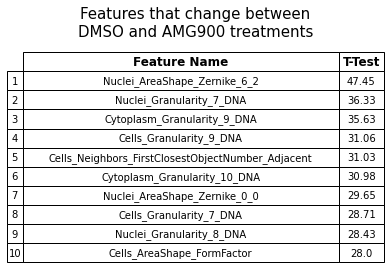

In [113]:
def plot_single_table(table_df, plot_title, fig, ax):
    table = ax.table(cellText=table_df.values, colLabels=table_df.columns, loc='center', cellLoc='center')

    ax.axis('off')
    ax.set_title(plot_title, fontsize=15)
    table.auto_set_font_size(False)
    for key, cell in table.get_celld().items():
        if key[0] == 0 or key[1] == -1:
            text = table._cells[key].get_text()
            text.set_fontweight('bold')
            text.set_fontsize(12)

    
    table.auto_set_column_width(col=list(range(len(clip_df.columns))))

    table.get_celld()[(0, 0)].set_linewidth(0)

    table.scale(1.5, 1.5)
    fig.tight_layout()
    fig.set_facecolor("white")

    return fig

fig, ax = plt.subplots()

plot = plot_single_table(clip_df, "Features that change between\nDMSO and AMG900 treatments", fig, ax)



In [53]:
pd.read_csv("/Users/ctromans/Downloads/Morpheus_Example_FeatureSelected.csv")

,Unnamed: 0,Metadata_Concentration,Metadata_moa,Metadata_Compound,Metadata_Plate,Metadata_Well,Cells_AreaShape_Compactness,Cells_AreaShape_Eccentricity,Cells_AreaShape_Extent,Cells_AreaShape_FormFactor,...,Nuclei_Texture_SumAverage_DNA_5_0,Nuclei_Texture_SumAverage_RNA_20_0,Nuclei_Texture_SumEntropy_DNA_10_0,Nuclei_Texture_SumEntropy_DNA_20_0,Nuclei_Texture_SumEntropy_DNA_5_0,Nuclei_Texture_SumEntropy_RNA_20_0,Nuclei_Texture_SumVariance_RNA_10_0,Nuclei_Texture_Variance_DNA_20_0,Nuclei_Texture_Variance_ER_20_0,Nuclei_Texture_Variance_RNA_20_0
0,0,0.00,DMSO,DMSO,SQ00015195,A01,-0.822020,-0.075336,1.223834,-1.956320,...,-1.440937,-1.009833,1.300275,0.898846,1.484104,-0.771877,-0.233147,1.673231,1.411891,1.526507
1,1,0.00,DMSO,DMSO,SQ00015195,A02,0.868327,2.649399,0.682239,-0.680453,...,-3.206421,-4.473190,-0.102291,-0.480672,-0.350701,-4.866834,-3.849305,-0.368757,0.682114,0.381323
2,2,0.00,DMSO,DMSO,SQ00015195,A03,-1.053129,-1.248110,0.666743,-1.064470,...,0.121409,-0.811745,0.222379,0.277556,0.166181,-0.678615,-0.396402,0.160436,-1.030875,0.071883
3,3,0.00,DMSO,DMSO,SQ00015195,A04,-0.907778,-0.629663,2.049594,0.306481,...,0.653975,2.015985,0.914372,0.562561,1.167740,1.179171,1.419980,1.147498,2.560806,0.771792
4,4,0.00,DMSO,DMSO,SQ00015195,A05,-0.708257,-0.422551,-0.115723,-0.524645,...,-0.050480,1.102265,1.040591,1.113570,1.084811,0.349723,0.061666,1.209480,1.142756,-1.148015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1915,379,3.33,topoisomerase inhibitor,etoposide,SQ00015221,P20,-2.399107,-0.821501,6.260044,-7.330029,...,0.928834,-2.172056,-2.668529,-1.349427,-8.328093,-2.165124,-1.894194,-3.714304,0.285391,-0.825984
1916,380,1.11,topoisomerase inhibitor,etoposide,SQ00015221,P21,-3.331789,-0.797576,4.358127,-5.007127,...,-1.846109,-0.203125,1.950478,3.023224,-0.566485,0.222524,-1.158631,1.646859,2.064042,-0.736931
1917,381,0.37,topoisomerase inhibitor,etoposide,SQ00015221,P22,-2.196081,-1.589165,2.453490,-1.774681,...,-0.684405,-0.963087,1.192883,1.268240,1.498845,-2.343231,-1.452264,0.569056,0.653778,-1.290920
1918,382,0.12,topoisomerase inhibitor,etoposide,SQ00015221,P23,-2.605366,-2.723491,2.006497,-1.898010,...,-0.339666,-1.515713,0.321631,0.537636,0.999894,-3.737373,-2.364335,-0.300792,-0.159041,-1.883261


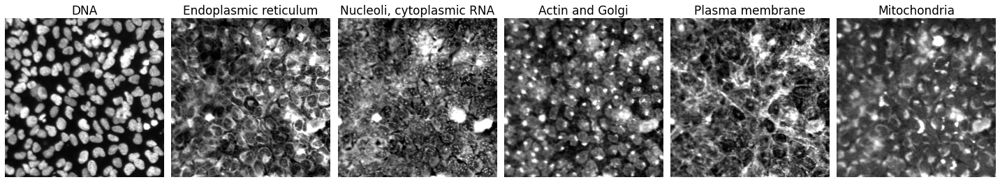

In [30]:
paths = [
    "../../../data/MolDev_DMSO_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_A11_s1_w1.TIF",
    "../../../data/MolDev_DMSO_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_A11_s1_w2.TIF",
    "../../../data/MolDev_DMSO_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_A11_s1_w3.TIF",
    "../../../data/MolDev_DMSO_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_A11_s1_w4.TIF",
    "../../../data/MolDev_DMSO_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_A11_s1_w5.TIF",
    "../../../data/MolDev_DMSO_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_A11_s1_w6.TIF",
]

channel_dict = {
            1: "DNA",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin and Golgi",
            5: "Plasma membrane",
            6: "Mitochondria"
        }

# Iterate over channels in reverse, since DNA is ch6
plot = utilssphering.plot_images(paths[::-1], crop=(1024, 1024), x0_y0=(500, 500), ch_names=channel_dict)

plot.savefig("(S6A1)-moldev-dmso-cell-painting.png", dpi=300, bbox_inches="tight")

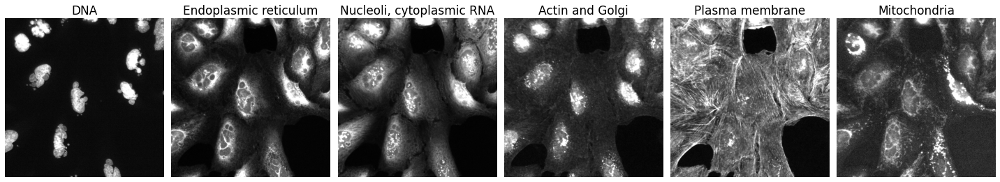

In [29]:
paths = [
    "../../../data/MolDev_AMG900_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_B19_s1_w1.TIF",
    "../../../data/MolDev_AMG900_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_B19_s1_w2.TIF",
    "../../../data/MolDev_AMG900_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_B19_s1_w3.TIF",
    "../../../data/MolDev_AMG900_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_B19_s1_w4.TIF",
    "../../../data/MolDev_AMG900_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_B19_s1_w5.TIF",
    "../../../data/MolDev_AMG900_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_B19_s1_w6.TIF",
]

channel_dict = {
            1: "DNA",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin and Golgi",
            5: "Plasma membrane",
            6: "Mitochondria"
        }

# Iterate over channels in reverse, since DNA is ch6
plot = utilssphering.plot_images(paths[::-1], crop=(1024, 1024), x0_y0=(500, 500), ch_names=channel_dict)

plot.savefig("(S6A2)-moldev-AMG900-cell-painting.png", dpi=300, bbox_inches="tight")

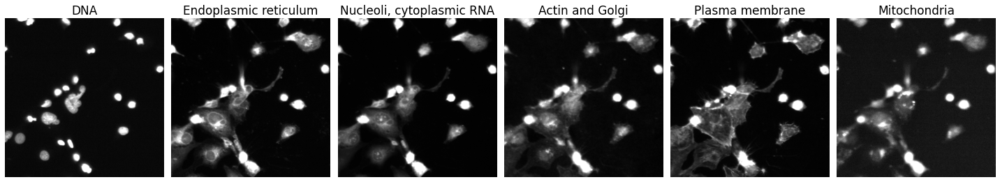

In [8]:
paths = [
    "../../../data/MolDev_PF-477736_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C04_s1_w1.TIF",
    "../../../data/MolDev_PF-477736_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C04_s1_w2.TIF",
    "../../../data/MolDev_PF-477736_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C04_s1_w3.TIF",
    "../../../data/MolDev_PF-477736_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C04_s1_w4.TIF",
    "../../../data/MolDev_PF-477736_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C04_s1_w5.TIF",
    "../../../data/MolDev_PF-477736_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C04_s1_w6.TIF",
]

channel_dict = {
            1: "DNA",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin and Golgi",
            5: "Plasma membrane",
            6: "Mitochondria"
        }

# Iterate over channels in reverse, since DNA is ch6
plot = utilssphering.plot_images(paths[::-1], crop=(1024, 1024), x0_y0=(500, 500), ch_names=channel_dict)

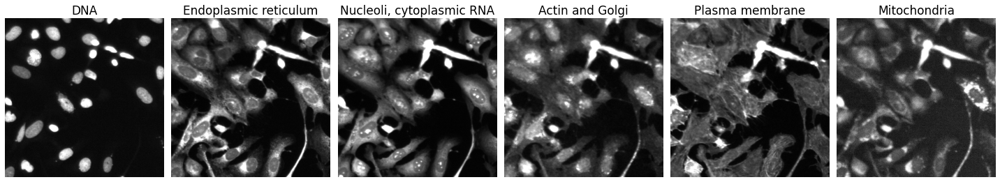

In [9]:
paths = [
    "../../../data/MolDev_SCH-900776_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C13_s1_w1.TIF",
    "../../../data/MolDev_SCH-900776_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C13_s1_w2.TIF",
    "../../../data/MolDev_SCH-900776_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C13_s1_w3.TIF",
    "../../../data/MolDev_SCH-900776_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C13_s1_w4.TIF",
    "../../../data/MolDev_SCH-900776_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C13_s1_w5.TIF",
    "../../../data/MolDev_SCH-900776_Plate2-PCO-6ch-4site-10XPA/Plate2-PCO-6ch-4site-10XPA_C13_s1_w6.TIF",
]

channel_dict = {
            1: "DNA",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin and Golgi",
            5: "Plasma membrane",
            6: "Mitochondria"
        }

# Iterate over channels in reverse, since DNA is ch6
plot = utilssphering.plot_images(paths[::-1], crop=(1024, 1024), x0_y0=(500, 500), ch_names=channel_dict)

# PE images

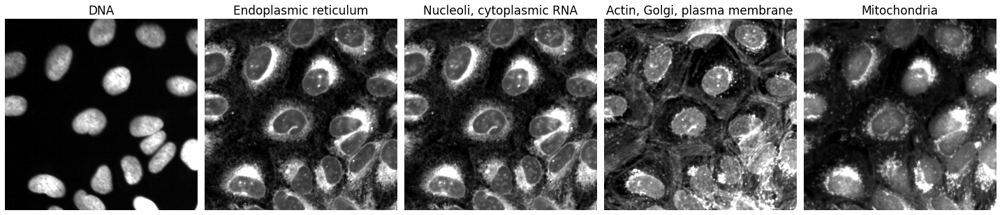

In [34]:
paths = [
    "../../../data/PE_DMSO_CP_Broad_Phenix_C_BIN1_1Plane_P1/r01c11f01p01-ch1sk1fk1fl1.tif",
    "../../../data/PE_DMSO_CP_Broad_Phenix_C_BIN1_1Plane_P1/r01c11f01p01-ch2sk1fk1fl1.tif",
    "../../../data/PE_DMSO_CP_Broad_Phenix_C_BIN1_1Plane_P1/r01c11f01p01-ch3sk1fk1fl1.tif",
    "../../../data/PE_DMSO_CP_Broad_Phenix_C_BIN1_1Plane_P1/r01c11f01p01-ch4sk1fk1fl1.tif",
    "../../../data/PE_DMSO_CP_Broad_Phenix_C_BIN1_1Plane_P1/r01c11f01p01-ch5sk1fk1fl1.tif",
]

plot = utilssphering.plot_images(paths, crop=(512, 512))

plot.savefig("(S6B1)-pe-dmso-cell-painting.png", dpi=300, bbox_inches="tight")

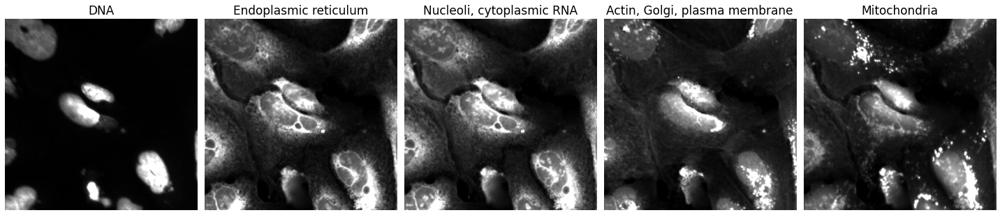

In [36]:
paths = [
    "../../../data/PE_AMG900_CP_Broad_Phenix_C_BIN1_1Plane_P1/r02c19f01p01-ch1sk1fk1fl1.tif",
    "../../../data/PE_AMG900_CP_Broad_Phenix_C_BIN1_1Plane_P1/r02c19f01p01-ch2sk1fk1fl1.tif",
    "../../../data/PE_AMG900_CP_Broad_Phenix_C_BIN1_1Plane_P1/r02c19f01p01-ch3sk1fk1fl1.tif",
    "../../../data/PE_AMG900_CP_Broad_Phenix_C_BIN1_1Plane_P1/r02c19f01p01-ch4sk1fk1fl1.tif",
    "../../../data/PE_AMG900_CP_Broad_Phenix_C_BIN1_1Plane_P1/r02c19f01p01-ch5sk1fk1fl1.tif",
]

plot = utilssphering.plot_images(paths, crop=(512, 512))

plot.savefig("(S6B2)-pe-AMG900-cell-painting.png", dpi=300, bbox_inches="tight")

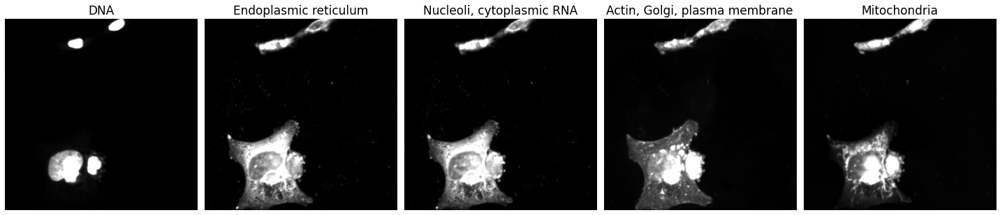

In [12]:
paths = [
    "../../../data/PE_PF-477736_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c04f01p01-ch1sk1fk1fl1.tif",
    "../../../data/PE_PF-477736_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c04f01p01-ch2sk1fk1fl1.tif",
    "../../../data/PE_PF-477736_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c04f01p01-ch3sk1fk1fl1.tif",
    "../../../data/PE_PF-477736_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c04f01p01-ch4sk1fk1fl1.tif",
    "../../../data/PE_PF-477736_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c04f01p01-ch5sk1fk1fl1.tif",
]

plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(450, 350))

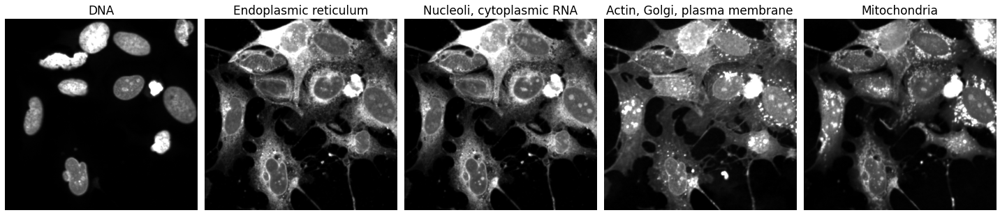

In [13]:
paths = [
    "../../../data/PE_SCH-900776_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c13f01p01-ch1sk1fk1fl1.tif",
    "../../../data/PE_SCH-900776_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c13f01p01-ch2sk1fk1fl1.tif",
    "../../../data/PE_SCH-900776_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c13f01p01-ch3sk1fk1fl1.tif",
    "../../../data/PE_SCH-900776_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c13f01p01-ch4sk1fk1fl1.tif",
    "../../../data/PE_SCH-900776_CP_Broad_Phenix_C_BIN1_1Plane_P1/r03c13f01p01-ch5sk1fk1fl1.tif",
]

plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(700, 600))

# Nikon images

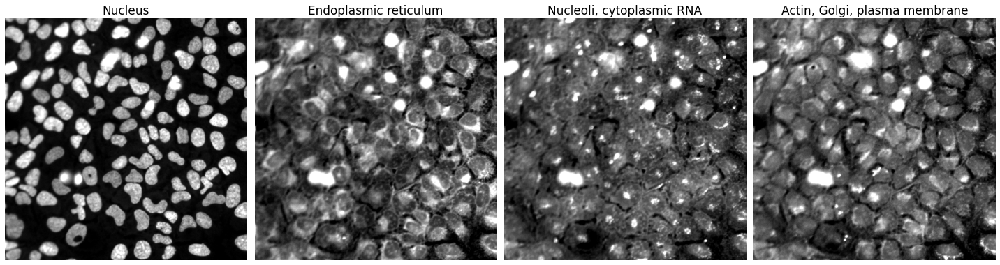

In [37]:
paths = [
    "../../../data/Nikon_DMSO_BR00117061a/c:1:4 - WellA11_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0010.nd2 (series 1)_ch1.tif",
    "../../../data/Nikon_DMSO_BR00117061a/c:1:4 - WellA11_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0010.nd2 (series 1)_ch2.tif",
    "../../../data/Nikon_DMSO_BR00117061a/c:3:4 - WellA11_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0010.nd2 (series 1)_ch3.tif",
    "../../../data/Nikon_DMSO_BR00117061a/c:4:4 - WellA11_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0010.nd2 (series 1)_ch4.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }


plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(0, 0), ch_names=channel_dict)

plot.savefig("(S6C1)-nikon-dmso-cell-painting.png", dpi=300, bbox_inches="tight")

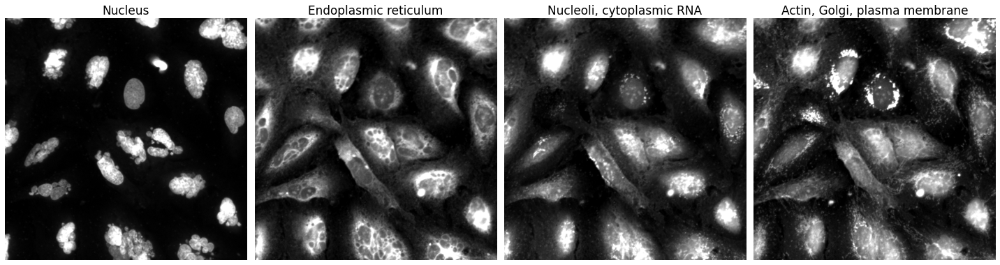

In [38]:
paths = [
    "../../../data/Nikon_AMG900_BR00117061a/WellB19_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0029_ch1.tif",
    "../../../data/Nikon_AMG900_BR00117061a/WellB19_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0029_ch2.tif",
    "../../../data/Nikon_AMG900_BR00117061a/WellB19_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0029_ch3.tif",
    "../../../data/Nikon_AMG900_BR00117061a/WellB19_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0029_ch4.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }


plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(0, 0), ch_names=channel_dict)

plot.savefig("(S6C2)-nikon-AMG900-cell-painting.png", dpi=300, bbox_inches="tight")

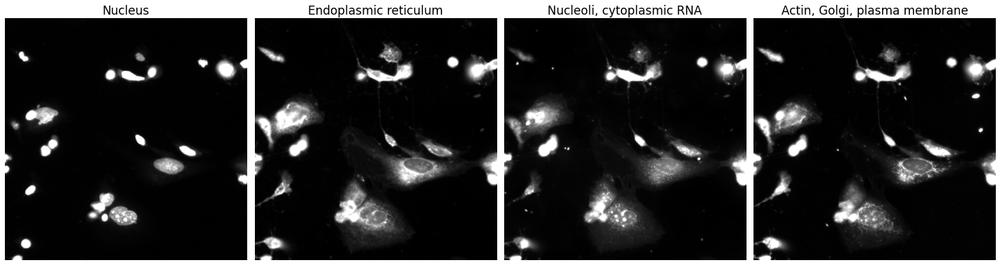

In [16]:
paths = [
    "../../../data/Nikon_PF-477736_BR00117061a/c:1:4 - WellC04_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0051.nd2 (series 1)_ch1.tif",
    "../../../data/Nikon_PF-477736_BR00117061a/c:2:4 - WellC04_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0051.nd2 (series 1)_ch2.tif",
    "../../../data/Nikon_PF-477736_BR00117061a/c:3:4 - WellC04_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0051.nd2 (series 1)_ch3.tif",
    "../../../data/Nikon_PF-477736_BR00117061a/c:4:4 - WellC04_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0051.nd2 (series 1)_ch4.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }


plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(0, 0), ch_names=channel_dict)

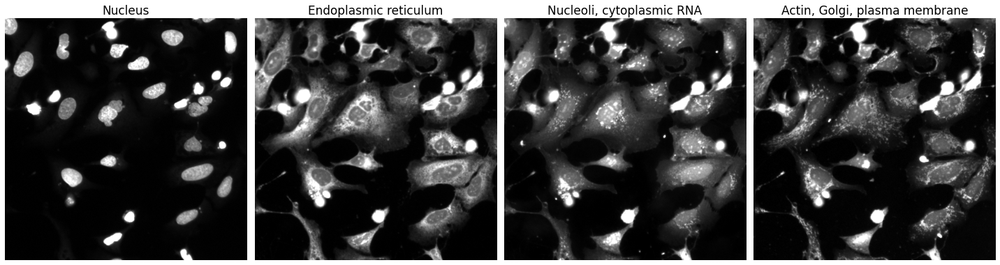

In [17]:
paths = [
    "../../../data/Nikon_SCH-900776_BR00117061a/c:1:4 - WellC13_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0060.nd2 (series 1)_ch1.tif",
    "../../../data/Nikon_SCH-900776_BR00117061a/c:1:4 - WellC13_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0060.nd2 (series 1)_ch2.tif",
    "../../../data/Nikon_SCH-900776_BR00117061a/c:3:4 - WellC13_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0060.nd2 (series 1)_ch3.tif",
    "../../../data/Nikon_SCH-900776_BR00117061a/c:4:4 - WellC13_ChannelDAPI Camera,FITC Camera,TRITC Camera,Cy5 Camera_Seq0060.nd2 (series 1)_ch4.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }


plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(0, 0), ch_names=channel_dict)

# Yokogawa Japan

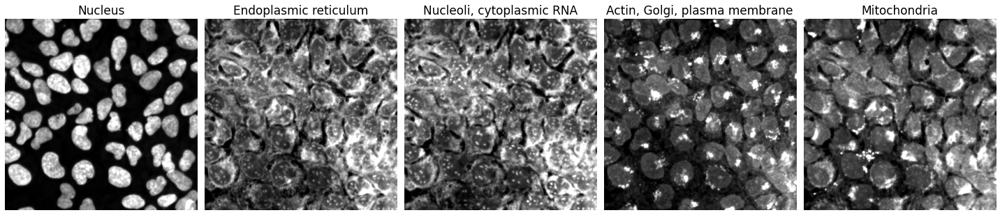

In [40]:
paths = [
    "../../../data/Yokogawa_Japan_DMSO_20201021T092317/W0011F0001T0001ZSUMC1.tif",
    "../../../data/Yokogawa_Japan_DMSO_20201021T092317/W0011F0001T0001ZSUMC2.tif",
    "../../../data/Yokogawa_Japan_DMSO_20201021T092317/W0011F0001T0001ZSUMC3.tif",
    "../../../data/Yokogawa_Japan_DMSO_20201021T092317/W0011F0001T0001ZSUMC4.tif",
    "../../../data/Yokogawa_Japan_DMSO_20201021T092317/W0011F0001T0001ZSUMC5.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }


plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(0, 0), ch_names=channel_dict)

plot.savefig("(S6D1)-yokogawa_japan-dmso-cell-painting.png", dpi=300, bbox_inches="tight")

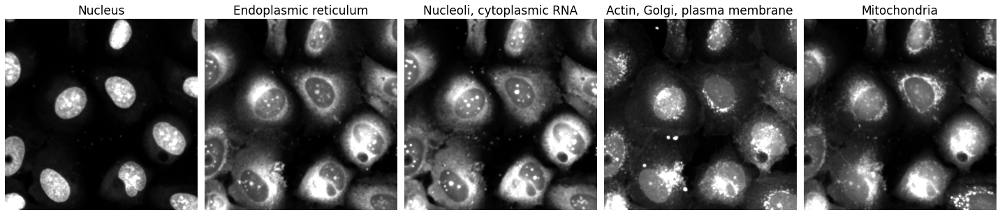

In [39]:
paths = [
    "../../../data/Yokogawa_Japan_AMG900_20201021T092317/W0049F0001T0001ZSUMC1.tif",
    "../../../data/Yokogawa_Japan_AMG900_20201021T092317/W0049F0001T0001ZSUMC2.tif",
    "../../../data/Yokogawa_Japan_AMG900_20201021T092317/W0049F0001T0001ZSUMC3.tif",
    "../../../data/Yokogawa_Japan_AMG900_20201021T092317/W0049F0001T0001ZSUMC4.tif",
    "../../../data/Yokogawa_Japan_AMG900_20201021T092317/W0049F0001T0001ZSUMC5.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }


plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(0, 0), ch_names=channel_dict)

plot.savefig("(S6D2)-yokogawa_japan-AMG900-cell-painting.png", dpi=300, bbox_inches="tight")

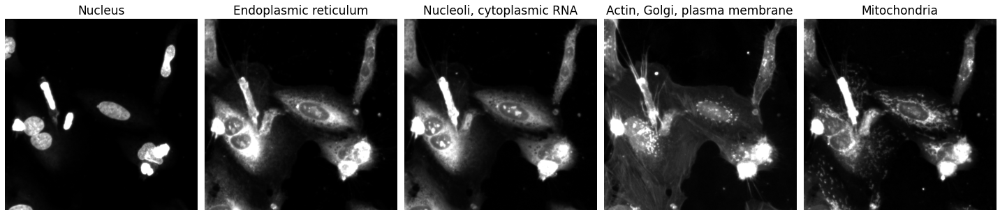

In [20]:
paths = [
    "../../../data/Yokogawa_Japan_PF-477736_20201021T092317/W0052F0001T0001ZSUMC1.tif",
    "../../../data/Yokogawa_Japan_PF-477736_20201021T092317/W0052F0001T0001ZSUMC2.tif",
    "../../../data/Yokogawa_Japan_PF-477736_20201021T092317/W0052F0001T0001ZSUMC3.tif",
    "../../../data/Yokogawa_Japan_PF-477736_20201021T092317/W0052F0001T0001ZSUMC4.tif",
    "../../../data/Yokogawa_Japan_PF-477736_20201021T092317/W0052F0001T0001ZSUMC5.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }


plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(500, 0), ch_names=channel_dict)

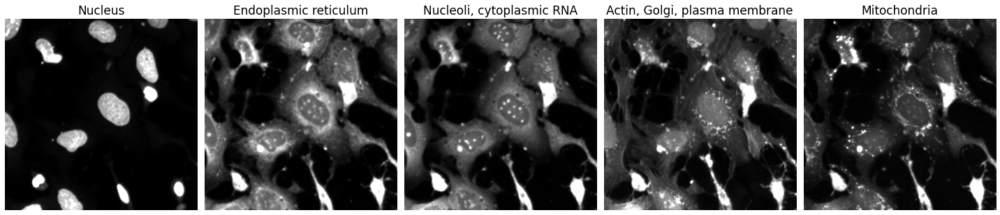

In [21]:
paths = [
    "../../../data/Yokogawa_Japan_SCH-900776_20201021T092317/W0061F0001T0001ZSUMC1.tif",
    "../../../data/Yokogawa_Japan_SCH-900776_20201021T092317/W0061F0001T0001ZSUMC2.tif",
    "../../../data/Yokogawa_Japan_SCH-900776_20201021T092317/W0061F0001T0001ZSUMC3.tif",
    "../../../data/Yokogawa_Japan_SCH-900776_20201021T092317/W0061F0001T0001ZSUMC4.tif",
    "../../../data/Yokogawa_Japan_SCH-900776_20201021T092317/W0061F0001T0001ZSUMC5.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }

plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(0, 0), ch_names=channel_dict)

# Yokogawa US

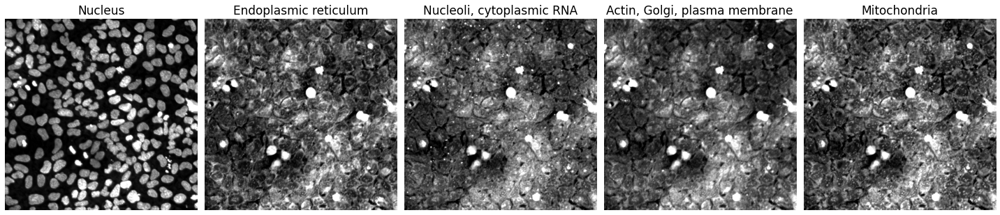

In [41]:
paths = [
    "../../../data/Yokogawa_US_DMSO_BRO0117014/PECCU_A11_T0001F001L01A03Z01C01.tif",
    "../../../data/Yokogawa_US_DMSO_BRO0117014/PECCU_A11_T0001F001L01A01Z01C02.tif",
    "../../../data/Yokogawa_US_DMSO_BRO0117014/PECCU_A11_T0001F001L01A01Z01C03.tif",
    "../../../data/Yokogawa_US_DMSO_BRO0117014/PECCU_A11_T0001F001L01A02Z01C04.tif",
    "../../../data/Yokogawa_US_DMSO_BRO0117014/PECCU_A11_T0001F001L01A02Z01C05.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }

plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(200, 200), ch_names=channel_dict)

plot.savefig("(S6E1)-yokogawa_us-dmso-cell-painting.png", dpi=300, bbox_inches="tight")

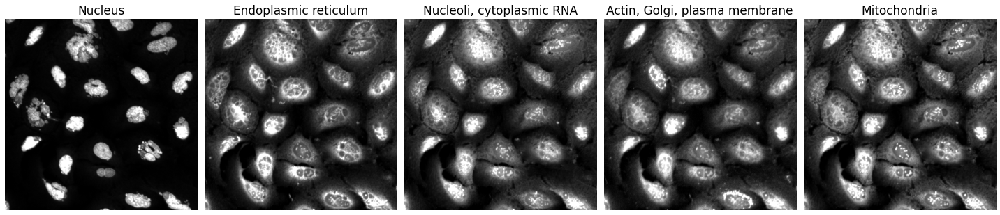

In [42]:
paths = [
    "../../../data/Yokogawa_US_AMG900_BRO0117014/PECCU_B19_T0001F001L01A03Z01C01.tif",
    "../../../data/Yokogawa_US_AMG900_BRO0117014/PECCU_B19_T0001F001L01A01Z01C02.tif",
    "../../../data/Yokogawa_US_AMG900_BRO0117014/PECCU_B19_T0001F001L01A01Z01C03.tif",
    "../../../data/Yokogawa_US_AMG900_BRO0117014/PECCU_B19_T0001F001L01A02Z01C04.tif",
    "../../../data/Yokogawa_US_AMG900_BRO0117014/PECCU_B19_T0001F001L01A02Z01C05.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }

plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(200, 200), ch_names=channel_dict)

plot.savefig("(S6E2)-yokogawa_us-AMG900-cell-painting.png", dpi=300, bbox_inches="tight")

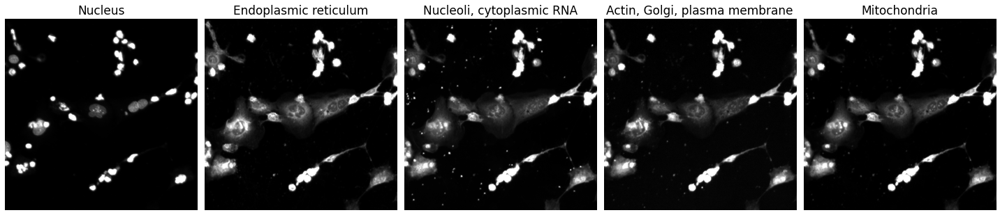

In [24]:
paths = [
    "../../../data/Yokogawa_US_PF-477736_BRO0117014/PECCU_C04_T0001F001L01A03Z01C01.tif",
    "../../../data/Yokogawa_US_PF-477736_BRO0117014/PECCU_C04_T0001F001L01A01Z01C02.tif",
    "../../../data/Yokogawa_US_PF-477736_BRO0117014/PECCU_C04_T0001F001L01A01Z01C03.tif",
    "../../../data/Yokogawa_US_PF-477736_BRO0117014/PECCU_C04_T0001F001L01A02Z01C04.tif",
    "../../../data/Yokogawa_US_PF-477736_BRO0117014/PECCU_C04_T0001F001L01A02Z01C05.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }

plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(200, 0), ch_names=channel_dict)

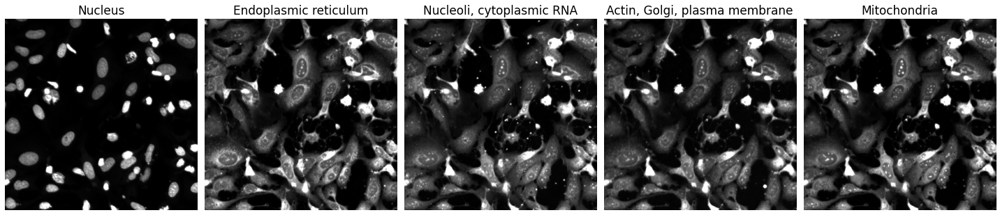

In [25]:
paths = [
    "../../../data/Yokogawa_US_SCH-900776_BRO0117014/PECCU_C13_T0001F001L01A03Z01C01.tif",
    "../../../data/Yokogawa_US_SCH-900776_BRO0117014/PECCU_C13_T0001F001L01A01Z01C02.tif",
    "../../../data/Yokogawa_US_SCH-900776_BRO0117014/PECCU_C13_T0001F001L01A01Z01C03.tif",
    "../../../data/Yokogawa_US_SCH-900776_BRO0117014/PECCU_C13_T0001F001L01A02Z01C04.tif",
    "../../../data/Yokogawa_US_SCH-900776_BRO0117014/PECCU_C13_T0001F001L01A02Z01C05.tif",
]

channel_dict = {
            1: "Nucleus",
            2: "Endoplasmic reticulum",
            3: "Nucleoli, cytoplasmic RNA",
            4: "Actin, Golgi, plasma membrane",
            5: "Mitochondria",
        }

plot = utilssphering.plot_images(paths, crop=(512, 512), x0_y0=(0, 0), ch_names=channel_dict)